# DATA PREPARATION

In [1]:
import numpy as np
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import joblib
import torch.optim as optim
import glob

warnings.filterwarnings('ignore')
plt.style.use("seaborn-v0_8-darkgrid")
np.random.seed(42)

## Basic Data Cleaning

In [2]:
def load_location_data(location_number):
    """
    Load data for a specific location, handling both regular and _2 files
    """
    files = []

    dir_name = "data/"
    
    try:
        regular_file = f'{dir_name}/L{location_number}_Train.csv'
        df1 = pd.read_csv(regular_file)
        files.append(df1)
    except FileNotFoundError:
        pass
    
    try:
        extra_file = f'{dir_name}/L{location_number}_Train_2.csv'
        df2 = pd.read_csv(extra_file)
        files.append(df2)
    except FileNotFoundError:
        pass
    
    if not files:
        raise FileNotFoundError(f"No data files found for location {location_number}")
    
    # Combine all available data
    df = pd.concat(files, ignore_index=True)
    
    # Basic preprocessing
    df['DateTime'] = pd.to_datetime(df['DateTime'])
    df = df.sort_values('DateTime')
    
    return df

def load_all_data():
    """
    Load data from all locations and combine into one DataFrame
    """
    all_data = []
    
    for location in range(1, 18):
        try:
            df = load_location_data(location)
            all_data.append(df)
        except FileNotFoundError:
            print(f"Warning: No data found for location {location}")
    
    combined_df = pd.concat(all_data, ignore_index=True)
    return combined_df

df = load_all_data()

def clean_and_prepare_data(df):
    # Remove obvious sensor errors
    df = df.copy()
    mask = (
        (df['Pressure(hpa)'] < 1030) & (df['Pressure(hpa)'] > 950) &
        (df['Temperature(°C)'] < 45) & (df['Temperature(°C)'] > 0) &
        (df['Humidity(%)'] <= 100) & (df['Humidity(%)'] > 10)
    )
    df = df[mask]

    # Create time features
    df['hour'] = df['DateTime'].dt.hour
    df['minute'] = df['DateTime'].dt.minute
    df['month'] = df['DateTime'].dt.month
    df['day'] = df['DateTime'].dt.day
    df['dayofweek'] = df['DateTime'].dt.dayofweek
    
    # Create cyclic features
    # Time features like hours (0-23) and months (1-12) are cyclical - hour 23 is actually close to hour 0, and December (12) is close to January (1)
    # Using raw numbers would make the model think these values are far apart, when they're actually adjacent in time
    df['hour_sin'] = np.sin(2 * np.pi * (df['hour'] + df['minute']/60)/24)
    df['hour_cos'] = np.cos(2 * np.pi * (df['hour'] + df['minute']/60)/24)
    df['month_sin'] = np.sin(2 * np.pi * df['month']/12)
    df['month_cos'] = np.cos(2 * np.pi * df['month']/12)

    # Handle sunlight saturation
    max_sunlight = 117758.2
    df['is_saturated'] = (df['Sunlight(Lux)'] >= max_sunlight).astype(int)
    
    # Print summary statistics after cleaning
    print("\nAfter Cleaning:")
    print("Total records:", len(df))
    print("\nRecords per location:")
    print(df.groupby('LocationCode').size())
    
    # Check data ranges after cleaning
    print("\nCleaned data ranges:")
    for col in ['WindSpeed(m/s)', 'Pressure(hpa)', 'Temperature(°C)', 'Humidity(%)', 'Sunlight(Lux)', 'Power(mW)']:
        print(f"\n{col}:")
        print(f"Min: {df[col].min():.2f}")
        print(f"Max: {df[col].max():.2f}")
        print(f"Mean: {df[col].mean():.2f}")
    
    return df

# Clean and prepare the data
cleaned_df = clean_and_prepare_data(df)
df = cleaned_df
df


After Cleaning:
Total records: 1257917

Records per location:
LocationCode
1      91900
2      84833
3      52281
4      54812
5      43401
6      37281
7      42248
8     135224
9      99510
10     95802
11     56956
12     89717
13     66757
14     63437
15     80740
16     78291
17     84727
dtype: int64

Cleaned data ranges:

WindSpeed(m/s):
Min: 0.00
Max: 17.25
Mean: 0.31

Pressure(hpa):
Min: 958.15
Max: 1029.99
Mean: 1009.38

Temperature(°C):
Min: 2.00
Max: 44.99
Mean: 28.95

Humidity(%):
Min: 11.43
Max: 100.00
Mean: 73.96

Sunlight(Lux):
Min: 20.00
Max: 117758.20
Mean: 16719.33

Power(mW):
Min: 0.00
Max: 2626.48
Mean: 170.80


,LocationCode,DateTime,WindSpeed(m/s),Pressure(hpa),Temperature(°C),Humidity(%),Sunlight(Lux),Power(mW),hour,minute,month,day,dayofweek,hour_sin,hour_cos,month_sin,month_cos,is_saturated
0,1,2024-01-01 06:31:08,0.0,1016.50,17.5,86.8,25.00,0.00,6,31,1,1,0,0.990866,-0.134851,0.5,0.866025,0
1,1,2024-01-01 06:32:08,0.0,1016.53,17.5,86.7,28.33,0.00,6,32,1,1,0,0.990268,-0.139173,0.5,0.866025,0
2,1,2024-01-01 06:33:08,0.0,1016.57,17.5,86.7,32.50,0.00,6,33,1,1,0,0.989651,-0.143493,0.5,0.866025,0
3,1,2024-01-01 06:34:08,0.0,1016.58,17.5,86.7,39.17,0.00,6,34,1,1,0,0.989016,-0.147809,0.5,0.866025,0
4,1,2024-01-01 06:35:08,0.0,1016.59,17.5,86.7,45.83,0.00,6,35,1,1,0,0.988362,-0.152123,0.5,0.866025,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1375023,17,2024-07-12 15:26:46,0.0,1004.05,36.5,65.4,12315.00,35.91,15,26,7,12,4,-0.782608,-0.622515,-0.5,-0.866025,0
1375024,17,2024-07-12 15:27:47,0.0,1004.08,36.5,64.7,12692.50,38.23,15,27,7,12,4,-0.785317,-0.619094,-0.5,-0.866025,0
1375025,17,2024-07-12 15:28:47,0.0,1004.10,36.5,64.5,12960.00,39.95,15,28,7,12,4,-0.788011,-0.615661,-0.5,-0.866025,0
1375026,17,2024-07-12 15:29:47,0.0,1004.11,36.4,64.9,12751.67,38.51,15,29,7,12,4,-0.790690,-0.612217,-0.5,-0.866025,0


## Data Visualization

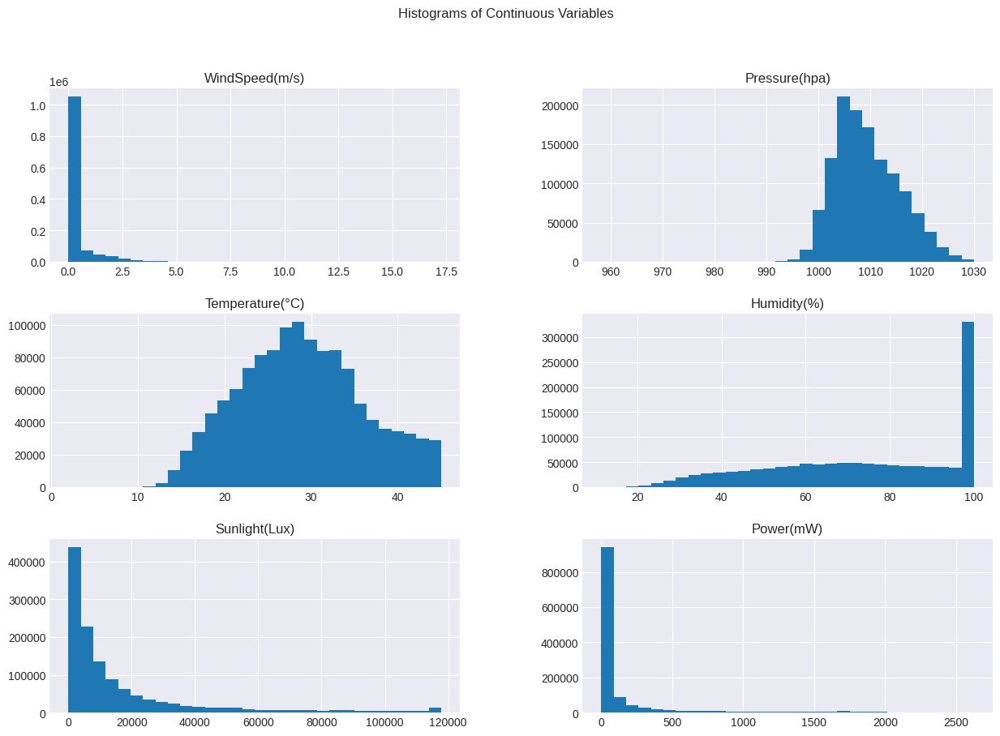

In [8]:
def plot_histograms(df):
    cols = ['WindSpeed(m/s)', 'Pressure(hpa)', 'Temperature(°C)', 'Humidity(%)', 'Sunlight(Lux)', 'Power(mW)']
    df[cols].hist(bins=30, figsize=(15, 10))
    plt.suptitle('Histograms of Continuous Variables')
    plt.show()

plot_histograms(cleaned_df)

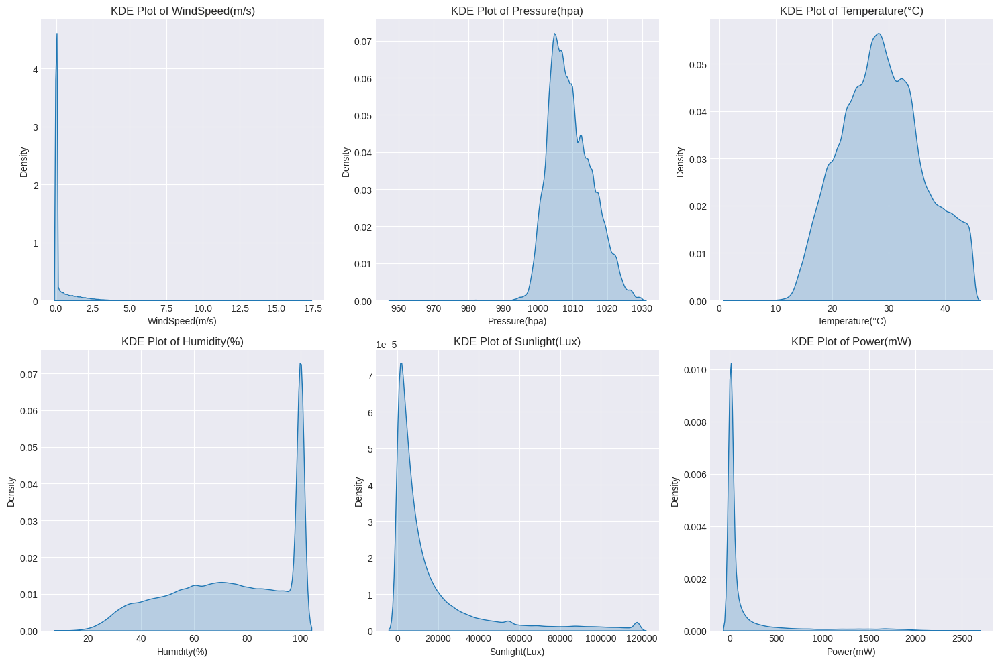

In [10]:
def plot_kde(df):
    cols = ['WindSpeed(m/s)', 'Pressure(hpa)', 'Temperature(°C)', 'Humidity(%)', 'Sunlight(Lux)', 'Power(mW)']
    num_cols = len(cols)
    nrows = (num_cols + 2) // 3  # Arrange in 3 columns, calculate rows needed
    
    fig, axes = plt.subplots(nrows=nrows, ncols=3, figsize=(15, 5 * nrows))
    axes = axes.flatten()  # Flatten axes for easier indexing
    
    for i, col in enumerate(cols):
        sns.kdeplot(df[col], shade=True, ax=axes[i])
        axes[i].set_title(f'KDE Plot of {col}')
    
    for i in range(len(cols), len(axes)):
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()

plot_kde(cleaned_df)

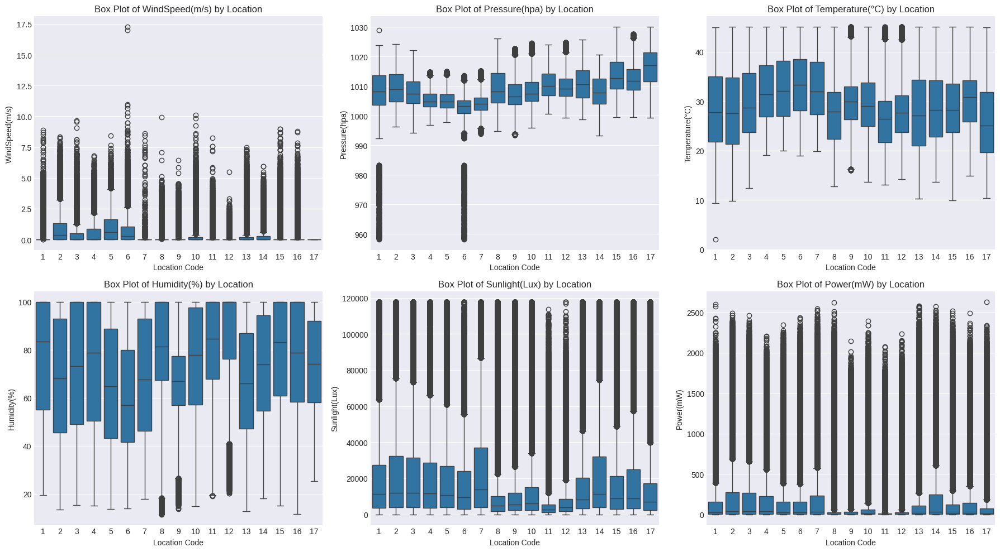

In [11]:
def plot_boxplots(df):
    cols = ['WindSpeed(m/s)', 'Pressure(hpa)', 'Temperature(°C)', 'Humidity(%)', 'Sunlight(Lux)', 'Power(mW)']
    num_cols = len(cols)
    nrows = (num_cols + 2) // 3
    
    fig, axes = plt.subplots(nrows=nrows, ncols=3, figsize=(18, 5 * nrows))
    axes = axes.flatten()
    
    for i, col in enumerate(cols):
        sns.boxplot(x='LocationCode', y=col, data=df, ax=axes[i])
        axes[i].set_title(f'Box Plot of {col} by Location')
        axes[i].set_xlabel('Location Code')
        axes[i].set_ylabel(col)
    
    for i in range(len(cols), len(axes)):
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()

plot_boxplots(cleaned_df)

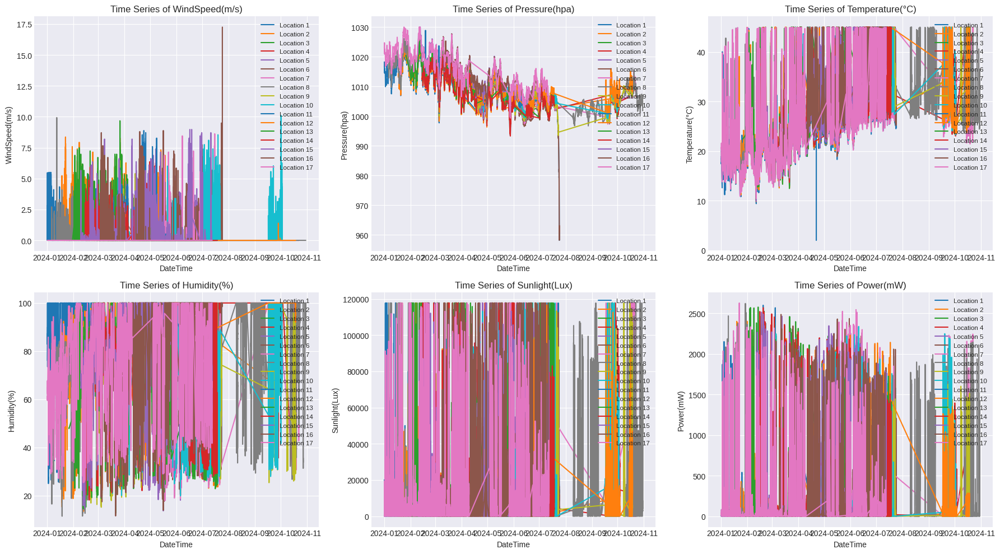

In [15]:
def plot_time_series(df):
    cols = ['WindSpeed(m/s)', 'Pressure(hpa)', 'Temperature(°C)', 'Humidity(%)', 'Sunlight(Lux)', 'Power(mW)']
    num_cols = len(cols)
    nrows = (num_cols + 2) // 3

    fig, axes = plt.subplots(nrows=nrows, ncols=3, figsize=(18, 5 * nrows))
    axes = axes.flatten()

    for i, col in enumerate(cols):
        for loc in df['LocationCode'].unique():
            loc_data = df[df['LocationCode'] == loc]
            axes[i].plot(loc_data['DateTime'], loc_data[col], label=f'Location {loc}')
        axes[i].set_title(f'Time Series of {col}')
        axes[i].set_xlabel('DateTime')
        axes[i].set_ylabel(col)
        axes[i].legend(loc='upper right', fontsize='small')
    
    for i in range(len(cols), len(axes)):
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()

plot_time_series(cleaned_df)

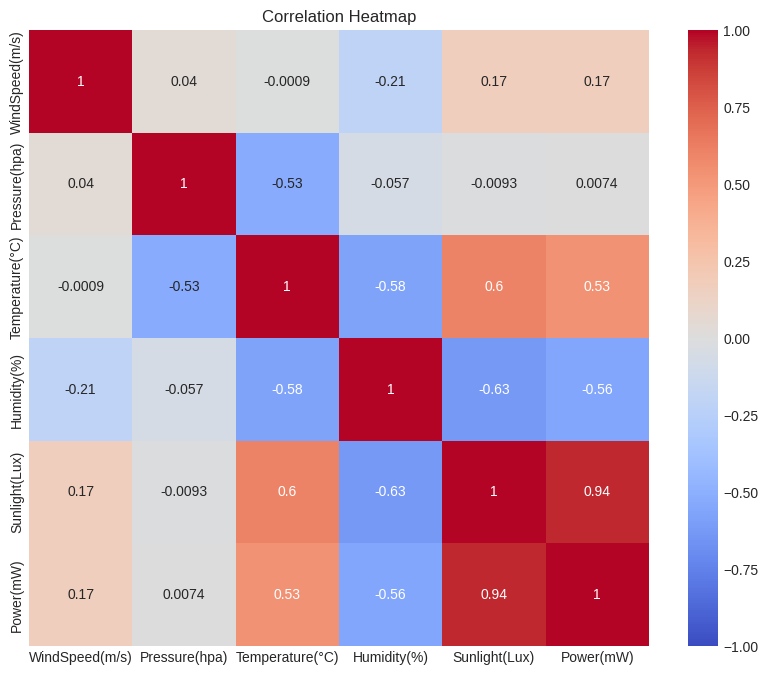

In [16]:
def plot_correlation_heatmap(df):
    plt.figure(figsize=(10, 8))
    corr = df[['WindSpeed(m/s)', 'Pressure(hpa)', 'Temperature(°C)', 'Humidity(%)', 'Sunlight(Lux)', 'Power(mW)']].corr()
    sns.heatmap(corr, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
    plt.title('Correlation Heatmap')
    plt.show()

plot_correlation_heatmap(cleaned_df)

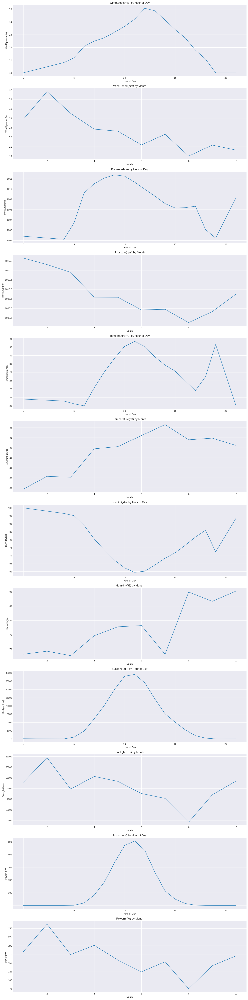

In [18]:
def plot_cyclic_features(df):
    features = ['WindSpeed(m/s)', 'Pressure(hpa)', 'Temperature(°C)', 'Humidity(%)', 'Sunlight(Lux)', 'Power(mW)']
    num_features = len(features)
    nrows = num_features * 2

    fig, axes = plt.subplots(nrows=nrows, ncols=1, figsize=(15, 5 * nrows))
    
    for i, feature in enumerate(features):
        sns.lineplot(x='hour', y=feature, data=df, ci=None, ax=axes[i * 2])
        axes[i * 2].set_title(f'{feature} by Hour of Day')
        axes[i * 2].set_xlabel('Hour of Day')
        axes[i * 2].set_ylabel(feature)
        
        sns.lineplot(x='month', y=feature, data=df, ci=None, ax=axes[i * 2 + 1])
        axes[i * 2 + 1].set_title(f'{feature} by Month')
        axes[i * 2 + 1].set_xlabel('Month')
        axes[i * 2 + 1].set_ylabel(feature)

    plt.tight_layout()
    plt.show()

plot_cyclic_features(cleaned_df)

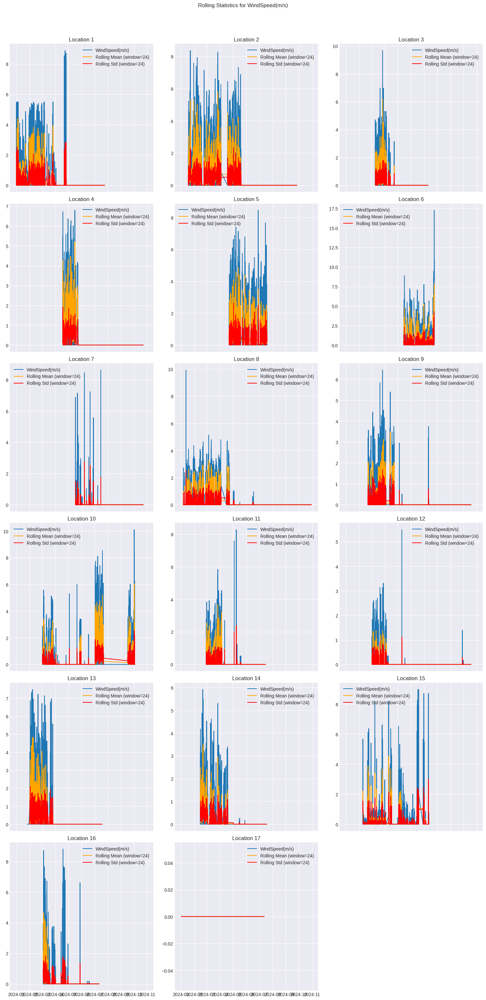

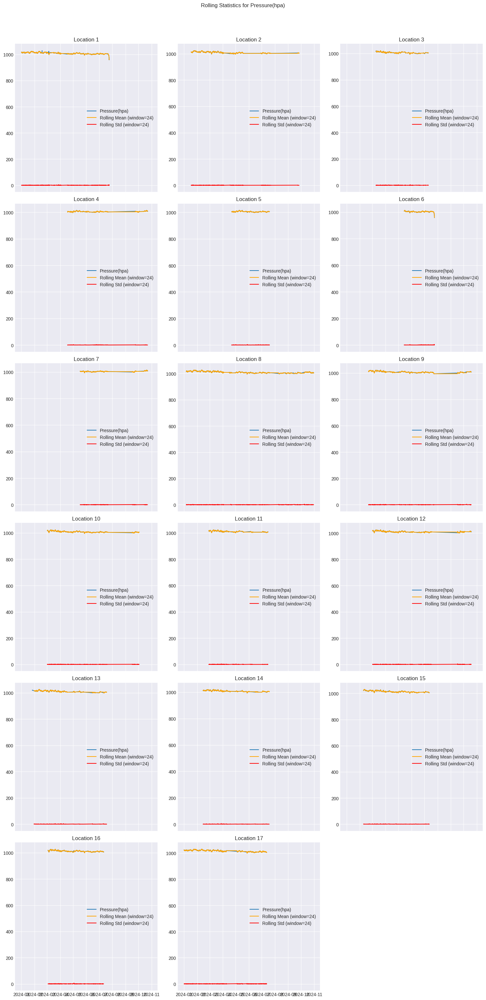

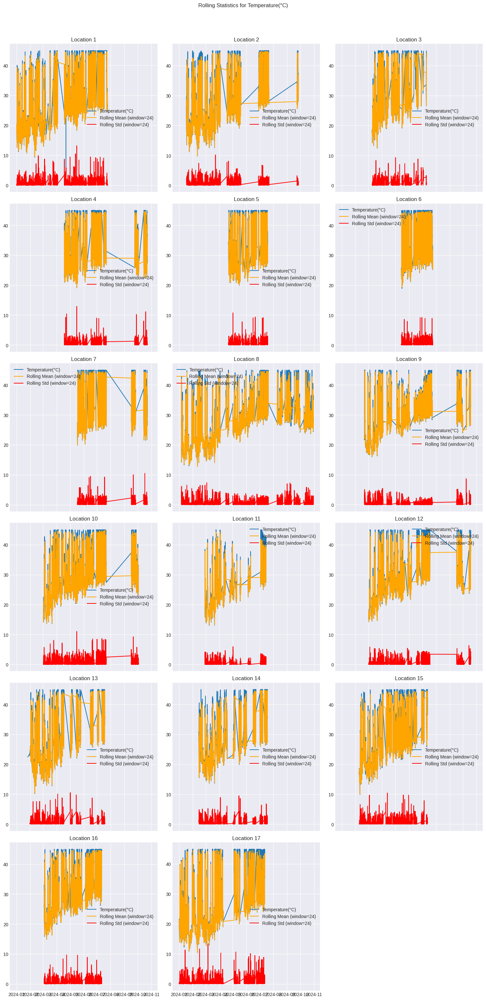

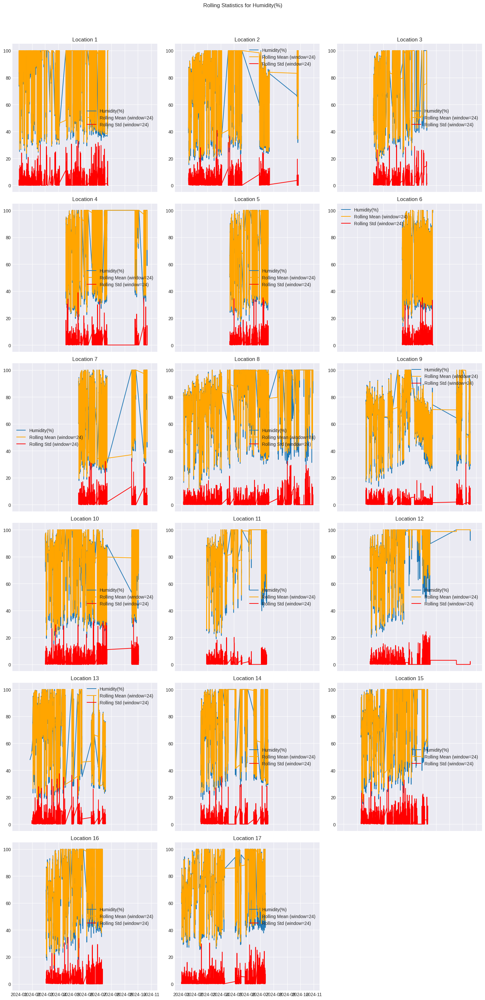

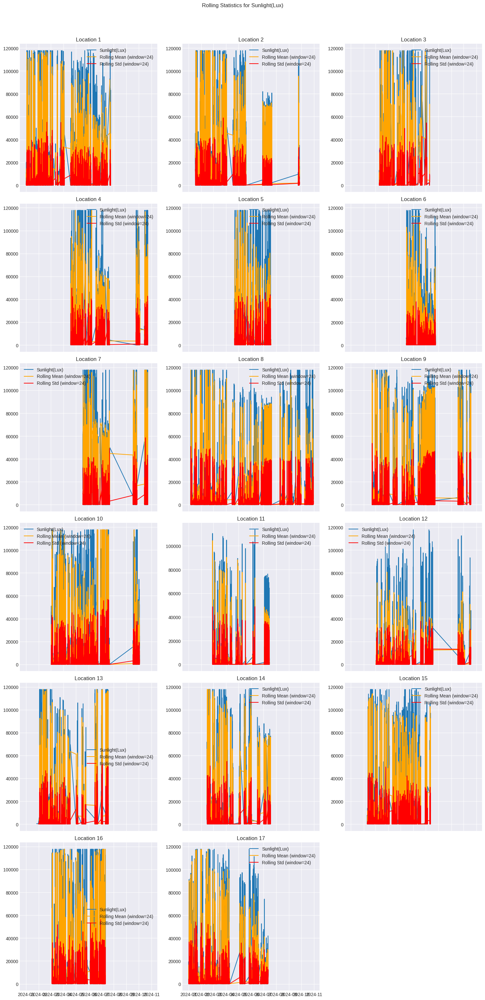

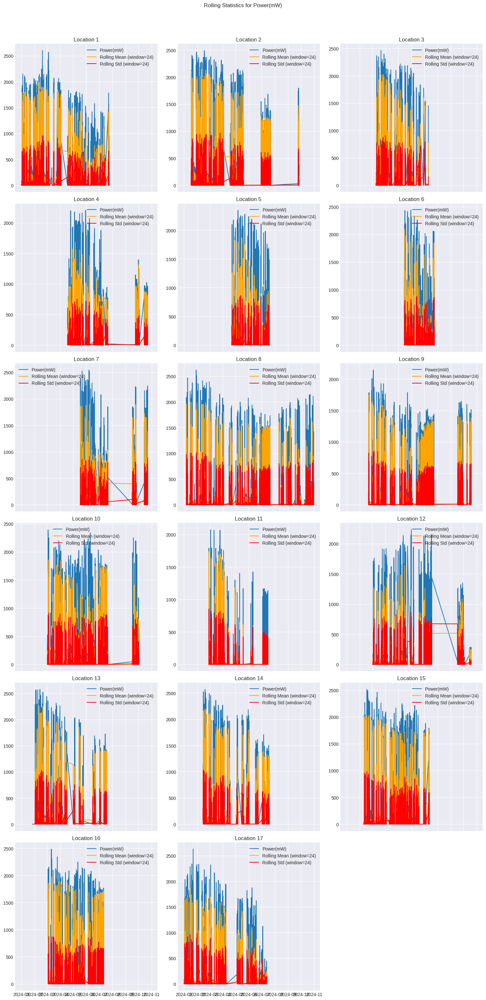

In [20]:
def plot_rolling_statistics_all_features(df, features, window=24):
    locations = df['LocationCode'].unique()
    num_locations = len(locations)
    num_features = len(features)
    num_cols = 3
    num_rows = (num_locations + num_cols - 1) // num_cols

    for feature in features:
        fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 5), sharex=True)
        axes = axes.flatten()

        for i, loc in enumerate(locations):
            loc_data = df[df['LocationCode'] == loc]
            rolling_mean = loc_data[feature].rolling(window=window).mean()
            rolling_std = loc_data[feature].rolling(window=window).std()

            axes[i].plot(loc_data['DateTime'], loc_data[feature], label=feature)
            axes[i].plot(loc_data['DateTime'], rolling_mean, label=f'Rolling Mean (window={window})', color='orange')
            axes[i].plot(loc_data['DateTime'], rolling_std, label=f'Rolling Std (window={window})', color='red')
            axes[i].set_title(f'Location {loc}')
            axes[i].legend()

        # Remove empty subplots
        for j in range(i + 1, len(axes)):
            fig.delaxes(axes[j])

        plt.suptitle(f'Rolling Statistics for {feature}', y=1.02)
        plt.tight_layout()
        plt.show()

features = ['WindSpeed(m/s)', 'Pressure(hpa)', 'Temperature(°C)', 'Humidity(%)', 'Sunlight(Lux)', 'Power(mW)']
plot_rolling_statistics_all_features(cleaned_df, features, window=24)

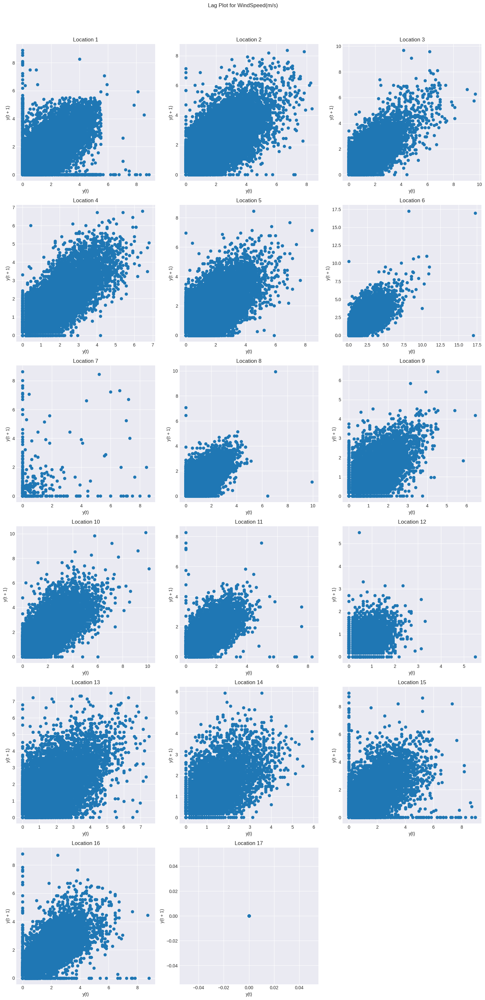

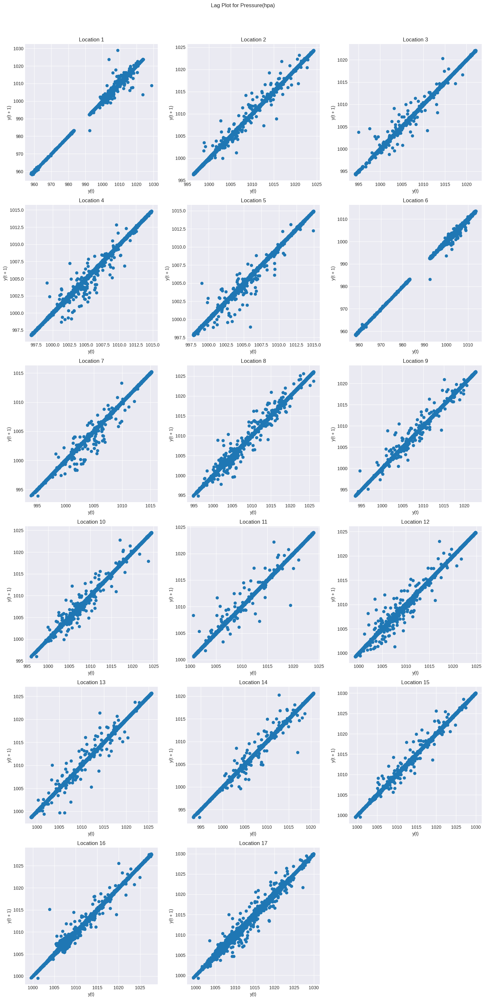

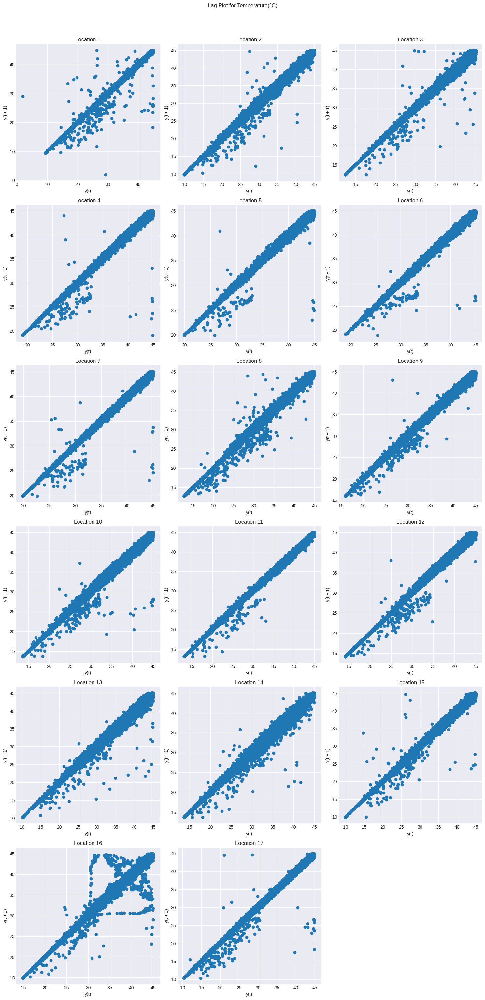

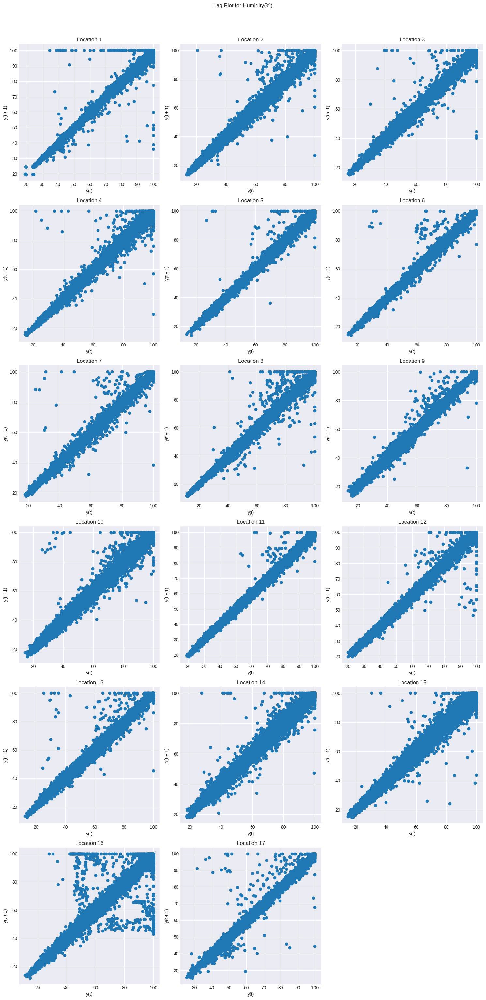

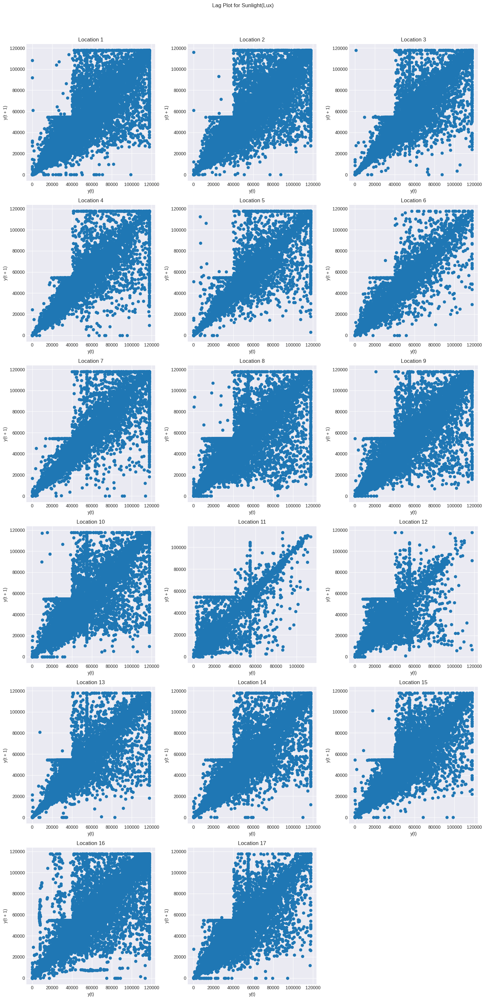

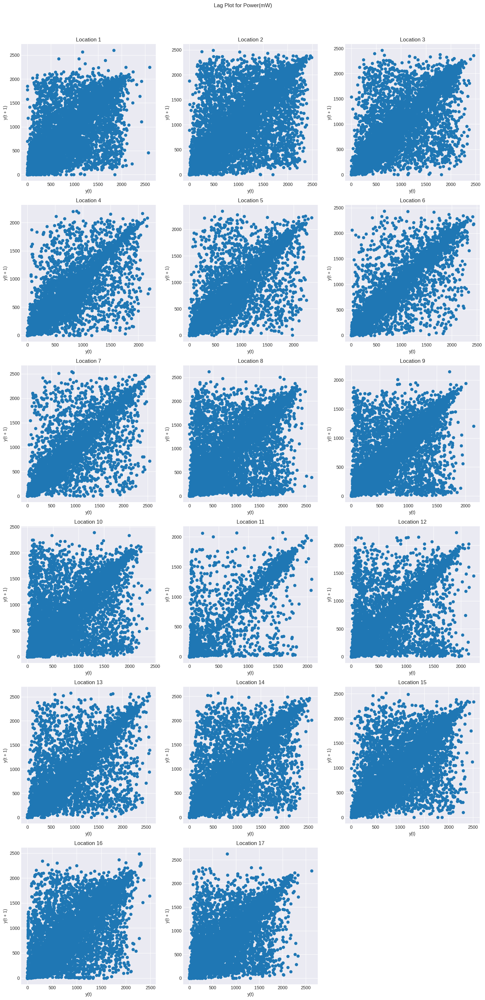

In [21]:
from pandas.plotting import lag_plot

def plot_lag_features_all_features(df, features, lag=1):
    locations = df['LocationCode'].unique()
    num_locations = len(locations)
    num_features = len(features)
    num_cols = 3  # Number of columns in the subplot grid
    num_rows = (num_locations + num_cols - 1) // num_cols  # Calculate the number of rows needed

    for feature in features:
        fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 5))
        axes = axes.flatten()  # Flatten the 2D array of axes to 1D for easy iteration

        for i, loc in enumerate(locations):
            loc_data = df[df['LocationCode'] == loc]
            lag_plot(loc_data[feature], lag=lag, ax=axes[i])
            axes[i].set_title(f'Location {loc}')

        # Remove empty subplots
        for j in range(i + 1, len(axes)):
            fig.delaxes(axes[j])

        plt.suptitle(f'Lag Plot for {feature}', y=1.02)
        plt.tight_layout()
        plt.show()

plot_lag_features_all_features(cleaned_df, features, lag=1)

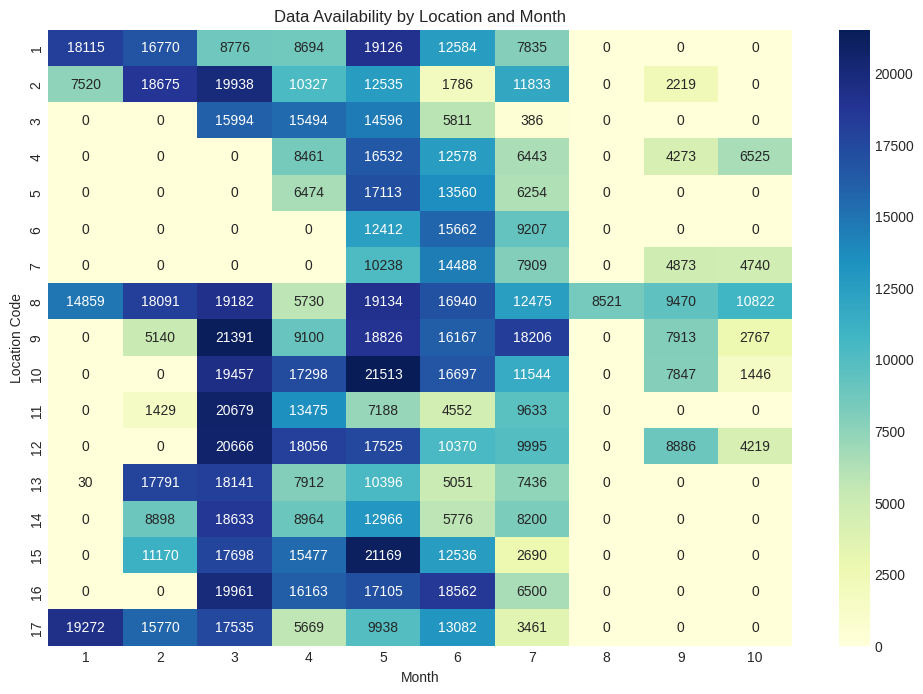

In [22]:
def plot_data_availability(df):
    # Create a pivot table to count records per location and month
    df['month'] = df['DateTime'].dt.month
    df['year'] = df['DateTime'].dt.year
    pivot_table = df.pivot_table(index='LocationCode', columns='month', values='DateTime', aggfunc='count', fill_value=0)
    
    plt.figure(figsize=(12, 8))
    sns.heatmap(pivot_table, annot=True, fmt='d', cmap='YlGnBu')
    plt.title('Data Availability by Location and Month')
    plt.xlabel('Month')
    plt.ylabel('Location Code')
    plt.show()

plot_data_availability(cleaned_df)

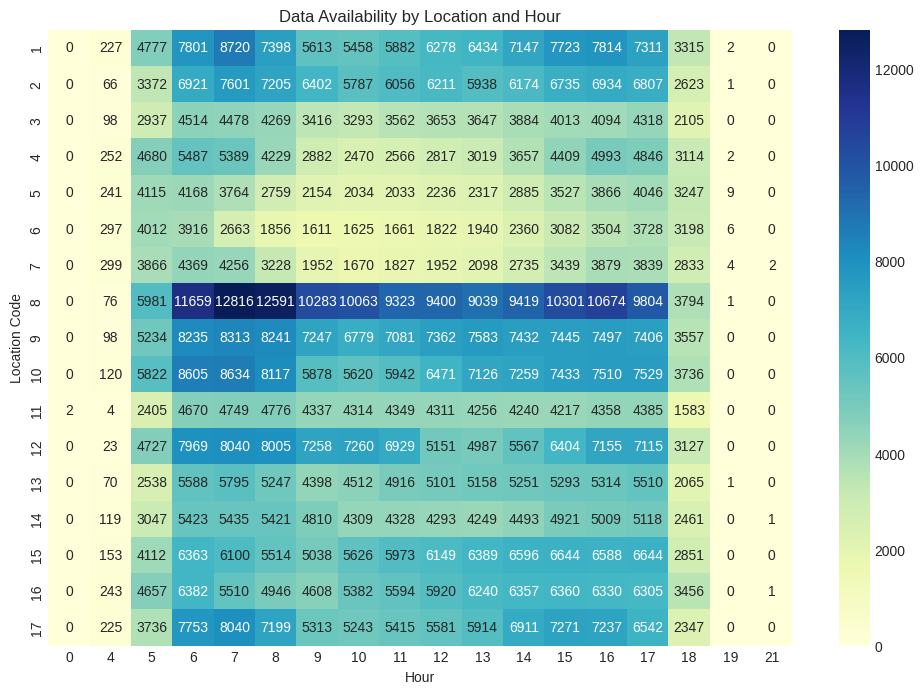

In [23]:
def plot_data_availability_by_hour(df):
    # Create a pivot table to count records per location and hour
    df['hour'] = df['DateTime'].dt.hour
    pivot_table = df.pivot_table(index='LocationCode', columns='hour', values='DateTime', aggfunc='count', fill_value=0)
    
    plt.figure(figsize=(12, 8))
    sns.heatmap(pivot_table, annot=True, fmt='d', cmap='YlGnBu')
    plt.title('Data Availability by Location and Hour')
    plt.xlabel('Hour')
    plt.ylabel('Location Code')
    plt.show()

plot_data_availability_by_hour(cleaned_df)

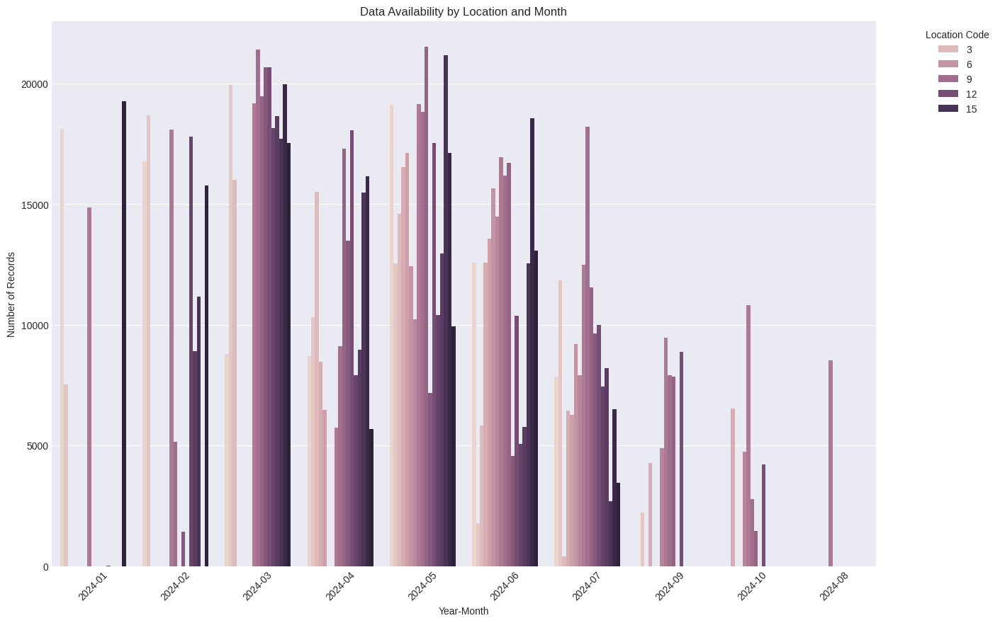

In [24]:
def plot_data_availability_bar(df):
    # Extract month and year from DateTime
    df['month'] = df['DateTime'].dt.month
    df['year'] = df['DateTime'].dt.year
    df['year_month'] = df['DateTime'].dt.to_period('M')
    
    # Count records per location and month
    count_per_month = df.groupby(['LocationCode', 'year_month']).size().reset_index(name='count')
    
    # Plot bar chart
    plt.figure(figsize=(15, 10))
    sns.barplot(x='year_month', y='count', hue='LocationCode', data=count_per_month)
    plt.title('Data Availability by Location and Month')
    plt.xlabel('Year-Month')
    plt.ylabel('Number of Records')
    plt.xticks(rotation=45)
    plt.legend(title='Location Code', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

plot_data_availability_bar(cleaned_df)

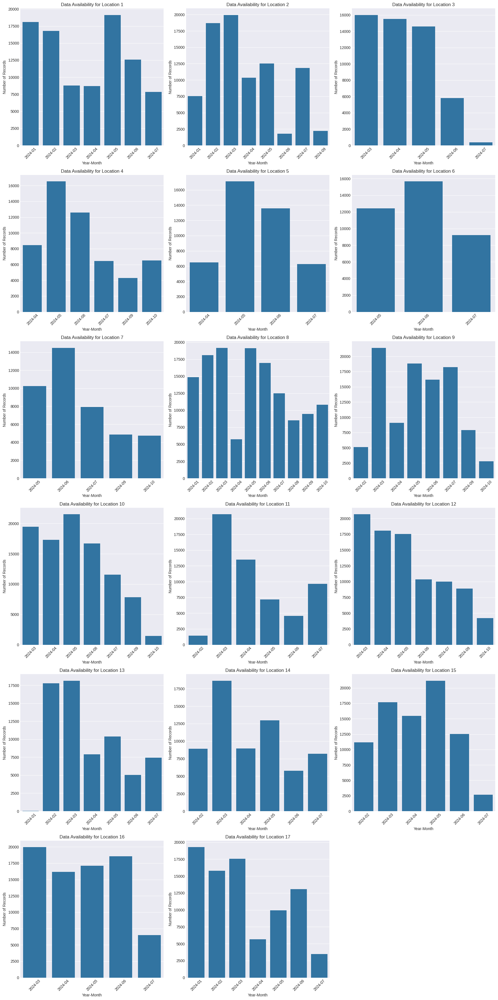

In [25]:
def plot_data_availability_bar_per_location(df):
    df['month'] = df['DateTime'].dt.month
    df['year'] = df['DateTime'].dt.year
    df['year_month'] = df['DateTime'].dt.to_period('M')
    
    count_per_month = df.groupby(['LocationCode', 'year_month']).size().reset_index(name='count')
    
    locations = df['LocationCode'].unique()
    num_locations = len(locations)
    nrows = (num_locations + 2) // 3
    
    fig, axes = plt.subplots(nrows=nrows, ncols=3, figsize=(18, 6 * nrows))
    axes = axes.flatten()
    
    for i, loc in enumerate(locations):
        loc_data = count_per_month[count_per_month['LocationCode'] == loc]
        sns.barplot(x='year_month', y='count', data=loc_data, ax=axes[i])
        axes[i].set_title(f'Data Availability for Location {loc}')
        axes[i].set_xlabel('Year-Month')
        axes[i].set_ylabel('Number of Records')
        axes[i].tick_params(axis='x', rotation=45)
    
    for i in range(len(locations), len(axes)):
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()

plot_data_availability_bar_per_location(cleaned_df)

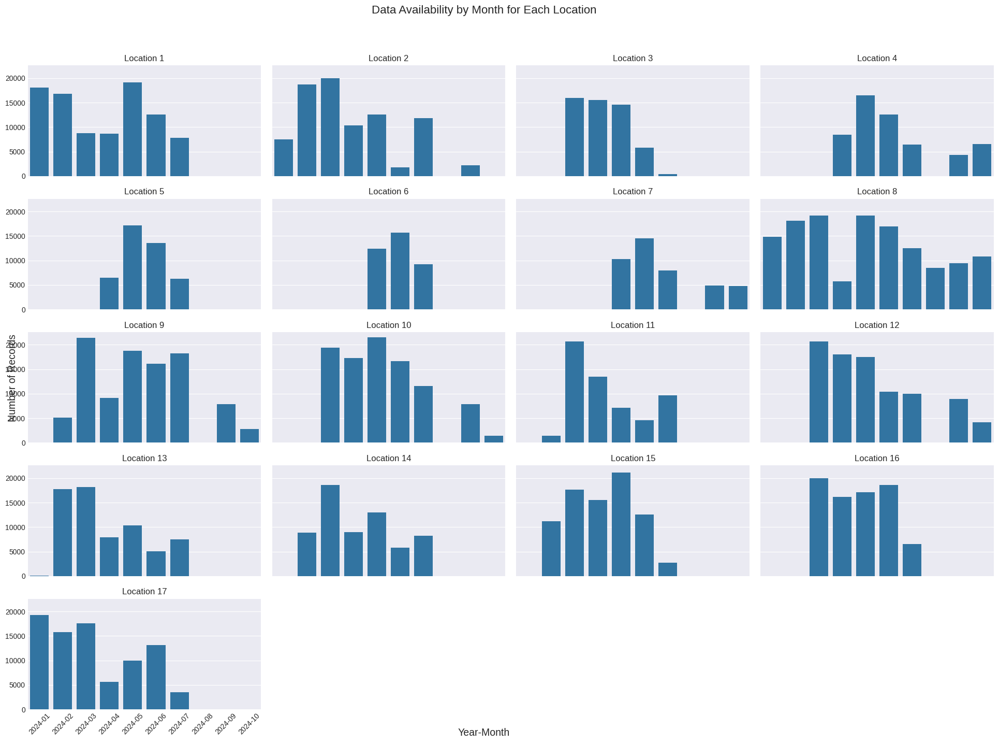

In [26]:
def plot_data_availability_bar_per_location(df):
    df['month'] = df['DateTime'].dt.month
    df['year'] = df['DateTime'].dt.year
    df['year_month'] = df['DateTime'].dt.to_period('M')
    
    count_per_month = df.groupby(['LocationCode', 'year_month']).size().reset_index(name='count')
    
    all_months = pd.period_range(start=df['DateTime'].min().to_period('M'), end=df['DateTime'].max().to_period('M'), freq='M')
    locations = df['LocationCode'].unique()
    complete_index = pd.MultiIndex.from_product([locations, all_months], names=['LocationCode', 'year_month'])
    count_per_month = count_per_month.set_index(['LocationCode', 'year_month']).reindex(complete_index, fill_value=0).reset_index()
    
    num_locations = len(locations)
    num_cols = 4
    num_rows = (num_locations + num_cols - 1) // num_cols
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 15), sharex=True, sharey=True)
    axes = axes.flatten()
    
    for i, loc in enumerate(locations):
        loc_data = count_per_month[count_per_month['LocationCode'] == loc]
        sns.barplot(x='year_month', y='count', data=loc_data, ax=axes[i])
        axes[i].set_title(f'Location {loc}')
        axes[i].set_xlabel('')
        axes[i].set_ylabel('')
        axes[i].tick_params(axis='x', rotation=45)
    
    fig.text(0.5, 0.04, 'Year-Month', ha='center', fontsize=14)
    fig.text(0.04, 0.5, 'Number of Records', va='center', rotation='vertical', fontsize=14)
    fig.suptitle('Data Availability by Month for Each Location', fontsize=16)
    
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])
    
    plt.tight_layout(rect=[0.03, 0.03, 1, 0.95])
    plt.show()

plot_data_availability_bar_per_location(cleaned_df)

### Visualizing and Understanding `upload.csv`. 

Checking data availability in `upload.csv`. This is the file we have to fill later!

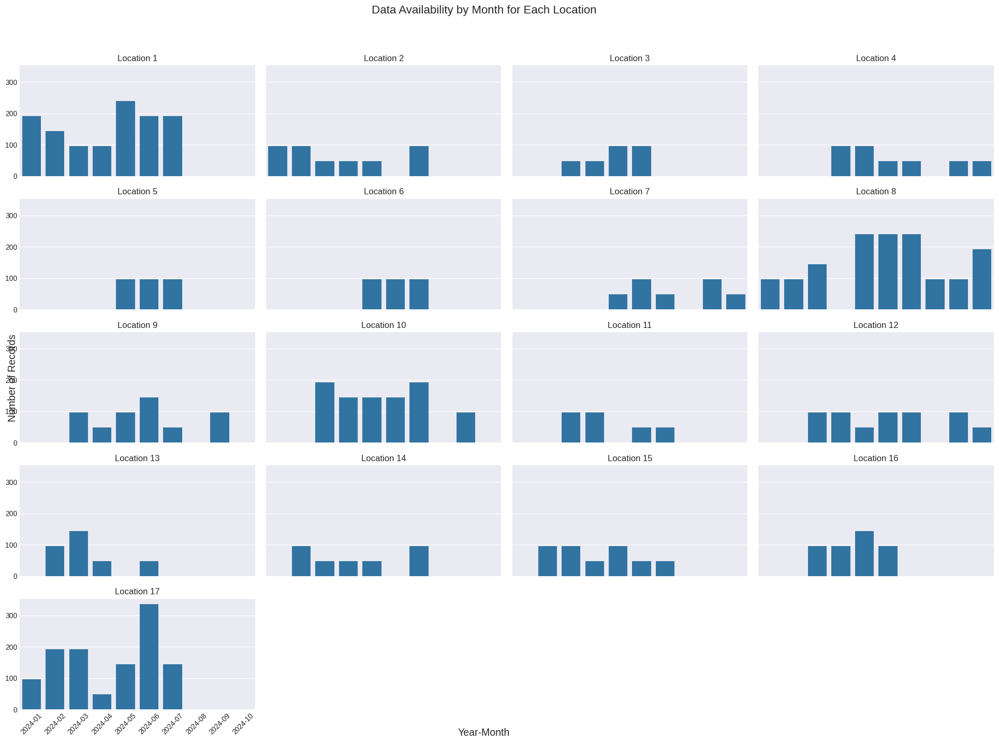

In [27]:
queries_df = pd.read_csv('data/upload.csv')

queries_df['序號'] = queries_df['序號'].astype(str)
queries_df['DateTime'] = pd.to_datetime(queries_df['序號'].str[:12], format='%Y%m%d%H%M')
queries_df['LocationCode'] = queries_df['序號'].str[12:].astype(int)

plot_data_availability_bar_per_location(queries_df)

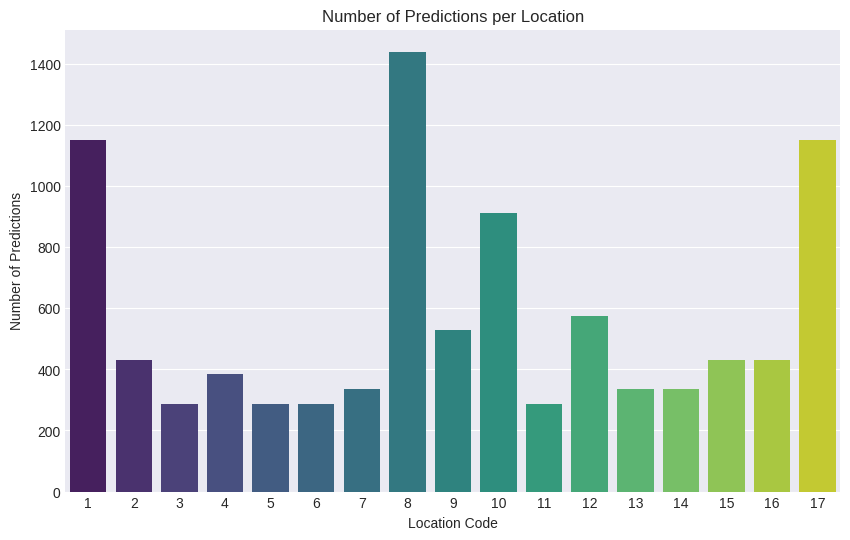

In [29]:
def plot_predictions_histogram(queries_df):
    predictions_per_location = queries_df.groupby('LocationCode').size().reset_index(name='count')
    
    plt.figure(figsize=(10, 6))
    sns.barplot(x='LocationCode', y='count', data=predictions_per_location, palette='viridis')
    plt.title('Number of Predictions per Location')
    plt.xlabel('Location Code')
    plt.ylabel('Number of Predictions')
    plt.show()

plot_predictions_histogram(queries_df)

In [30]:
def identify_and_print_prediction_months(df, queries_df):
    df['year_month'] = df['DateTime'].dt.to_period('M')
    queries_df['year_month'] = queries_df['DateTime'].dt.to_period('M')
    
    count_per_month = df.groupby(['LocationCode', 'year_month']).size().reset_index(name='count')
    queries_per_month = queries_df.groupby(['LocationCode', 'year_month']).size().reset_index(name='queries_count')
    
    combined_data = pd.merge(count_per_month, queries_per_month, on=['LocationCode', 'year_month'], how='right').fillna(0)
    
    for loc in queries_df['LocationCode'].unique():
        loc_data = combined_data[combined_data['LocationCode'] == loc]
        prediction_months = loc_data[loc_data['queries_count'] > 0]['year_month'].tolist()
        available_months = loc_data[loc_data['count'] > 0]['year_month'].tolist()
        
        prediction_months_str = ', '.join([month.strftime('%B') for month in prediction_months])
        missing_months = [month for month in prediction_months if month not in available_months]
        missing_months_str = ', '.join([month.strftime('%B') for month in missing_months])
        
        print(f"Location {loc} has to predict for {prediction_months_str}.")
        if missing_months:
            print(f"Training data doesn't have data for {missing_months_str}.") # 沒有印的話是好事！
        print()

identify_and_print_prediction_months(cleaned_df, queries_df)

Location 1 has to predict for January, February, March, April, May, June, July.

Location 2 has to predict for January, February, March, April, May, July.

Location 3 has to predict for March, April, May, June.

Location 4 has to predict for April, May, June, July, September, October.

Location 5 has to predict for May, June, July.

Location 6 has to predict for May, June, July.

Location 7 has to predict for May, June, July, September, October.

Location 8 has to predict for January, February, March, May, June, July, August, September, October.

Location 9 has to predict for March, April, May, June, July, September.

Location 10 has to predict for March, April, May, June, July, September.

Location 11 has to predict for March, April, June, July.

Location 12 has to predict for March, April, May, June, July, September, October.

Location 13 has to predict for February, March, April, June.

Location 14 has to predict for February, March, April, May, July.

Location 15 has to predict for

In [31]:
for i in range(1, 18):
    print("Location", i)
    print("Months available in training data", cleaned_df[cleaned_df['LocationCode']==i]['month'].unique())
    print("Months available in testing data", queries_df[queries_df['LocationCode']==i]['month'].unique())

Location 1
Months available in training data [1 2 3 4 5 6 7]
Months available in testing data [1 2 3 4 5 6 7]
Location 2
Months available in training data [1 2 3 4 5 6 7 9]
Months available in testing data [1 2 3 4 5 7]
Location 3
Months available in training data [3 4 5 6 7]
Months available in testing data [3 4 5 6]
Location 4
Months available in training data [ 4  5  6  7  9 10]
Months available in testing data [ 4  5  6  7  9 10]
Location 5
Months available in training data [4 5 6 7]
Months available in testing data [5 6 7]
Location 6
Months available in training data [5 6 7]
Months available in testing data [5 6 7]
Location 7
Months available in training data [ 5  6  7  9 10]
Months available in testing data [ 5  6  7  9 10]
Location 8
Months available in training data [ 1  2  3  4  5  6  7  8  9 10]
Months available in testing data [ 1  2  3  5  6  7  8  9 10]
Location 9
Months available in training data [ 2  3  4  5  6  7  9 10]
Months available in testing data [3 4 5 6 7 9]
Loc